# Food Access Research Project(Jvk Chaitanya: 436001072)

## Introduction

This project deals with 2019 Atlas dataset which contains information about SNAP program and how they are used among different group of people in different states of USA along with demographic distribution.

THe objective of this Project is to find how each feature in data impacts the outcome of other feature and try to predict some of the features.

Throughout this project we are gonna find answers to these following set of questions:

1. What is the distribution of median family income across urban and rural tracts?
2. How does accessibility (low-income and low-access flags) relate to the distribution of SNAP benefits?
3. What are the demographic characteristics (race, age, etc.) of low-income vs. high-income tracts?
4. How do racial distributions differ between low-income and high-income tracts?
5. What factors are associated with the distribution of SNAP benefits across tracts?
6. Are SNAP benefits higher in low-income tracts compared to high-income tracts?
7. What are the correlations between demographic, income, and accessibility features?
8. How do urban and rural areas differ in terms of population and poverty rates?
9. Is there a significant difference in poverty rates across low-income and high-income tracts?
10. Do urban areas have significantly higher median family incomes than rural areas?


## Dataset Description

The dataset was picked from https://data.gov, this is a opensource website maintained by US government and stores all the data that are generated by different departments like US food & Agriculture, US Health, etc.

Source of Data: https://www.ers.usda.gov/data-products/food-access-research-atlas/download-the-data/

Even tough we have various features that are provided in data, we are only gonna work on selected features to work in this project:

State: State name <br>
County: County name<br>
Urban: Flag for urban tract<br>
Pop2010: Population count from 2010 census<br>
OHU2010: Occupied housing unit count from 2010 census<br>
NUMGQTRS: Count of tract population residing in group quarters<br>
LILATracts_halfAnd10: Flag for low-income and low access when considering low accessibilty at 1/2 and 10 miles<br>
LILATracts_1And20: Flag for low-income and low access when considering low accessibilty at 1 and 20 miles<br>
LowIncomeTracts: Flag for  low income tract<br>
PovertyRate: Share of the tract population living with income at or below the Federal poverty thresholds for family size<br>
MedianFamilyIncome: Tract median family income<br>
LATracts_half: Flag for low access tract when considering 1/2 mile distance<br>
LATracts1: Flag for low access tract when considering 1 mile distance<br>
LATracts10: Flag for low access tract when considering 10 mile distance<br>
LATracts20: Flag for low access tract when considering 20 mile distance<br>
LATractsVehicle_20: Flag for tract where >= 100 of households do not have a vehicle, and beyond 1/2 mile from supermarket; or >= 500 individuals are beyond 20 miles from<br> supermarket ; or >= 33% of individuals are beyond 20 miles from supermarket<br>
TractLOWI: Total count of low-income population in tract <br>
TractKids: Total count of children age 0-17 in tract <br>
TractSeniors: Total count of seniors age 65+ in tract <br>
TractWhite: Total count of White population in tract <br>
TractBlack: Total count of Black or African American population in tract<br> 
TractAsian: Total count of Asian population in tract <br>
TractNHOPI: Total count of Native Hawaiian and Other Pacific Islander population in tract<br> 
TractAIAN: Total count of American Indian and Alaska Native population in tract <br>
TractOMultir: Total count of Other/Multiple race population in tract <br>
TractHispanic: Total count of Hispanic or Latino population in tract <br>
TractHUNV: Total count of housing units without a vehicle in tract<br>
TractSNAP: Total count of housing units receiving SNAP benefits in tract<br> 

### Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer

### Load Data

In [ ]:
data = pd.read_excel(r"C:\Users\jvkch\OneDrive\Desktop\stat 600\project 2\FoodAccessResearchAtlasData2019.xlsx",sheet_name='Food Access Research Atlas')
data.head()

,CensusTract,State,County,Urban,Pop2010,OHU2010,GroupQuartersFlag,NUMGQTRS,PCTGQTRS,LILATracts_1And10,...,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP
0,1001020100,Alabama,Autauga County,1,1912,693,0,0.0,0.000000,0,...,221.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0,6.0,102.0
1,1001020200,Alabama,Autauga County,1,2170,743,0,181.0,8.341014,1,...,214.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0,89.0,156.0
2,1001020300,Alabama,Autauga County,1,3373,1256,0,0.0,0.000000,0,...,439.0,2576.0,647.0,17.0,5.0,11.0,117.0,87.0,99.0,172.0
3,1001020400,Alabama,Autauga County,1,4386,1722,0,0.0,0.000000,0,...,904.0,4086.0,193.0,18.0,4.0,11.0,74.0,85.0,21.0,98.0
4,1001020500,Alabama,Autauga County,1,10766,4082,0,181.0,1.681219,0,...,1126.0,8666.0,1437.0,296.0,9.0,48.0,310.0,355.0,230.0,339.0


In [3]:
data_1 = data[["State","County","Urban","Pop2010","OHU2010","NUMGQTRS","LILATracts_halfAnd10","LILATracts_1And20","LowIncomeTracts","PovertyRate","MedianFamilyIncome","LATracts_half","LATracts1","LATracts10","LATracts20","LATractsVehicle_20","TractLOWI","TractKids","TractSeniors","TractWhite","TractBlack","TractAsian","TractNHOPI","TractAIAN","TractOMultir","TractHispanic","TractHUNV","TractSNAP"]]
data_1.head()

,State,County,Urban,Pop2010,OHU2010,NUMGQTRS,LILATracts_halfAnd10,LILATracts_1And20,LowIncomeTracts,PovertyRate,...,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP
0,Alabama,Autauga County,1,1912,693,0.0,0,0,0,11.336453,...,221.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0,6.0,102.0
1,Alabama,Autauga County,1,2170,743,181.0,1,1,1,17.876788,...,214.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0,89.0,156.0
2,Alabama,Autauga County,1,3373,1256,0.0,0,0,0,15.046030,...,439.0,2576.0,647.0,17.0,5.0,11.0,117.0,87.0,99.0,172.0
3,Alabama,Autauga County,1,4386,1722,0.0,0,0,0,2.845210,...,904.0,4086.0,193.0,18.0,4.0,11.0,74.0,85.0,21.0,98.0
4,Alabama,Autauga County,1,10766,4082,181.0,0,0,0,15.150891,...,1126.0,8666.0,1437.0,296.0,9.0,48.0,310.0,355.0,230.0,339.0


In [4]:
# Check distribution of data
data_1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Urban,72531.0,0.760626,0.426704,0.0,1.000000,1.000000,1.000000,1.0
Pop2010,72531.0,4256.739022,1955.987626,1.0,2899.000000,4011.000000,5330.500000,37452.0
OHU2010,72531.0,1609.191821,725.676046,0.0,1108.000000,1525.000000,2021.000000,16043.0
NUMGQTRS,72506.0,110.121549,443.931753,0.0,0.000000,7.000000,64.000000,19496.0
LILATracts_halfAnd10,72531.0,0.279150,0.448584,0.0,0.000000,0.000000,1.000000,1.0
LILATracts_1And20,72531.0,0.112228,0.315649,0.0,0.000000,0.000000,0.000000,1.0
LowIncomeTracts,72531.0,0.417573,0.493162,0.0,0.000000,0.000000,1.000000,1.0
PovertyRate,72528.0,15.183628,11.919764,0.0,6.495831,11.951363,20.597443,100.0
MedianFamilyIncome,71783.0,77037.792249,37544.445885,2499.0,51484.000000,68821.000000,93868.500000,250001.0
LATracts_half,72531.0,0.638830,0.480343,0.0,0.000000,1.000000,1.000000,1.0


In [5]:
# check dtypes and structure of data
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72531 entries, 0 to 72530
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 72531 non-null  object 
 1   County                72531 non-null  object 
 2   Urban                 72531 non-null  int64  
 3   Pop2010               72531 non-null  int64  
 4   OHU2010               72531 non-null  int64  
 5   NUMGQTRS              72506 non-null  float64
 6   LILATracts_halfAnd10  72531 non-null  int64  
 7   LILATracts_1And20     72531 non-null  int64  
 8   LowIncomeTracts       72531 non-null  int64  
 9   PovertyRate           72528 non-null  float64
 10  MedianFamilyIncome    71783 non-null  float64
 11  LATracts_half         72531 non-null  int64  
 12  LATracts1             72531 non-null  int64  
 13  LATracts10            72531 non-null  int64  
 14  LATracts20            72531 non-null  int64  
 15  LATractsVehicle_20 

## Data Preprocessing

In [6]:
# Check for null values
data_1.isna().sum()

State                     0
County                    0
Urban                     0
Pop2010                   0
OHU2010                   0
NUMGQTRS                 25
LILATracts_halfAnd10      0
LILATracts_1And20         0
LowIncomeTracts           0
PovertyRate               3
MedianFamilyIncome      748
LATracts_half             0
LATracts1                 0
LATracts10                0
LATracts20                0
LATractsVehicle_20        0
TractLOWI                 4
TractKids                 4
TractSeniors              4
TractWhite                4
TractBlack                4
TractAsian                4
TractNHOPI                4
TractAIAN                 4
TractOMultir              4
TractHispanic             4
TractHUNV                 4
TractSNAP                 4
dtype: int64

In [7]:
# checking shape of data
data_1.shape

(72531, 28)

In [8]:
# we have enough data to remove 4 records where all the values from TractLOWI is null
columns_to_check = [
    "TractLOWI", "TractKids", "TractSeniors", "TractWhite", 
    "TractBlack", "TractAsian", "TractNHOPI", "TractAIAN", 
    "TractOMultir", "TractHispanic", "TractHUNV", "TractSNAP"
]

data_1 = data_1.dropna(subset=columns_to_check, how='all')

# Drop rows where State is 'New Mexico' and County is 'Rio Arriba County', these combo have no median income so better drop it
data_1 = data_1[~((data_1['State'] == 'New Mexico') & (data_1['County'] == 'Rio Arriba County'))]


In [9]:
# Fill NUMGQTRS and MedianFamilyIncome based on median grouped by State and County
columns_to_fill = ['NUMGQTRS', 'MedianFamilyIncome']

for column in columns_to_fill:
    data_1[column] = data_1.groupby(['State', 'County'])[column].transform(
        lambda x: x.fillna(x.median())
    )


In [10]:
# Rename some columns for easy understanding
data_1.rename(columns={'LILATracts_halfAnd10':'LILA 0.5 Miles(U)/ 10 Miles(R)','LILATracts_1And20':'LILA 1 Miles(U) / 20 Miles(R)'},inplace=True)
data_1.head()

,State,County,Urban,Pop2010,OHU2010,NUMGQTRS,LILA 0.5 Miles(U)/ 10 Miles(R),LILA 1 Miles(U) / 20 Miles(R),LowIncomeTracts,PovertyRate,...,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP
0,Alabama,Autauga County,1,1912,693,0.0,0,0,0,11.336453,...,221.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0,6.0,102.0
1,Alabama,Autauga County,1,2170,743,181.0,1,1,1,17.876788,...,214.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0,89.0,156.0
2,Alabama,Autauga County,1,3373,1256,0.0,0,0,0,15.046030,...,439.0,2576.0,647.0,17.0,5.0,11.0,117.0,87.0,99.0,172.0
3,Alabama,Autauga County,1,4386,1722,0.0,0,0,0,2.845210,...,904.0,4086.0,193.0,18.0,4.0,11.0,74.0,85.0,21.0,98.0
4,Alabama,Autauga County,1,10766,4082,181.0,0,0,0,15.150891,...,1126.0,8666.0,1437.0,296.0,9.0,48.0,310.0,355.0,230.0,339.0


## Exploratory Data Analysis (EDA)

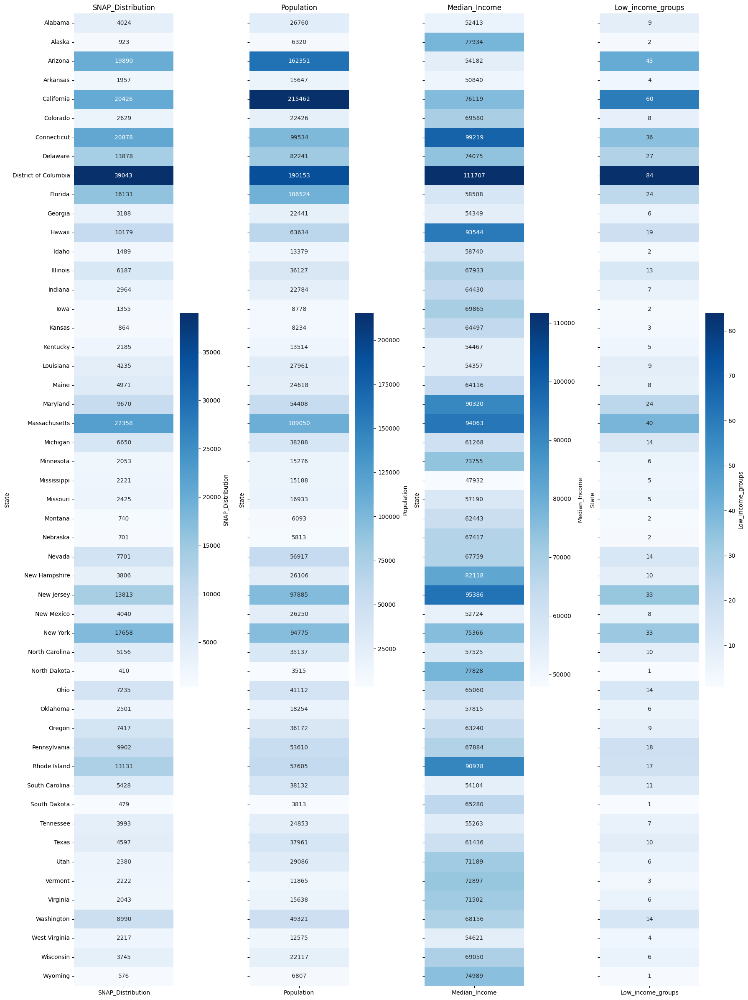

In [11]:
# Group data by State and County, aggregating relevant columns
grouped_data = data_1.groupby(['State', 'County']).agg({
    'TractSNAP': 'sum',
    'TractLOWI': 'sum',
    'MedianFamilyIncome': 'median',
    'LowIncomeTracts':'sum'
}).reset_index()

# Rename columns for clarity
grouped_data.rename(columns={
    'TractSNAP': 'SNAP_Distribution',
    'TractLOWI': 'Population',
    'MedianFamilyIncome': 'Median_Income',
    'LowIncomeTracts':'Low_income_groups'
}, inplace=True)

# Set up the figure and axes
metrics = ['SNAP_Distribution', 'Population', 'Median_Income','Low_income_groups']
fig, axes = plt.subplots(1, len(metrics), figsize=(18, 24), sharey=True)

# Create a heatmap for each metric
for ax, metric in zip(axes, metrics):
    sns.heatmap(
        grouped_data.pivot_table(index='State', values=metric, aggfunc='mean'),
        annot=True, fmt='.0f', cmap='Blues', cbar_kws={'label': metric},
        ax=ax
    )
    ax.set_title(metric)
    ax.set_xlabel('')

# Adjust layout
plt.tight_layout()
plt.show()


If we see above visualization, we can see that states with higher population tends to have higher SNAP Distribution, This is a valid observation for now.

Also there is other observation we can see that Low Income groups are populated in highly populated states, Lets once confirm distribution of SNAP benefits among Low Income tract

In [12]:
# check distribution of SNAP benefits between low income and high income tracts
data_1.groupby(by='LowIncomeTracts')['TractSNAP'].median()

LowIncomeTracts
0     91.0
1    275.0
Name: TractSNAP, dtype: float64

So based on above observation we can confirm that, states with high population recived higher SNAP benefits due to high number of low income tracts in these states.

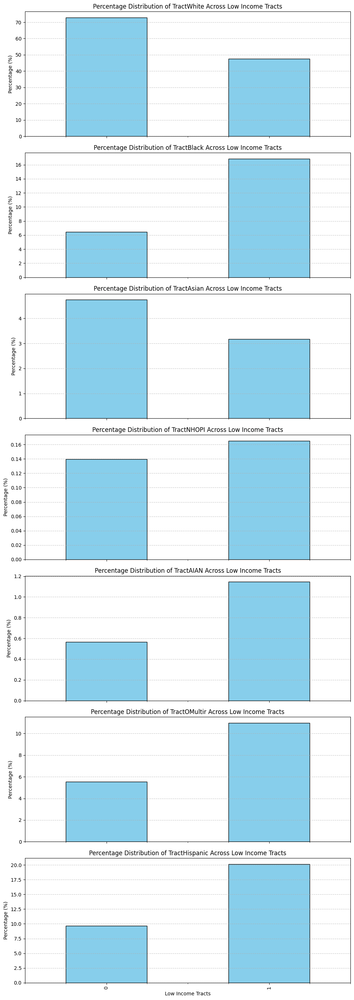

In [13]:
# Group by 'LowIncomeTracts' and calculate the sum for normalization
race_distribution = data_1.groupby(by='LowIncomeTracts')[[
    'TractWhite', 'TractBlack', 'TractAsian', 'TractNHOPI', 
    'TractAIAN', 'TractOMultir', 'TractHispanic'
]].sum()

# Convert to percentages
race_distribution_percentage = race_distribution.div(race_distribution.sum(axis=1), axis=0) * 100


# Plot each race as a separate bar plot
races = race_distribution_percentage.columns
fig, axes = plt.subplots(nrows=len(races), figsize=(10, len(races) * 4), sharex=True)

for ax, race in zip(axes, races):
    race_distribution_percentage[race].plot(
        kind='bar', ax=ax, color='skyblue', edgecolor='black'
    )
    ax.set_title(f'Percentage Distribution of {race} Across Low Income Tracts')
    ax.set_ylabel('Percentage (%)')
    ax.set_xlabel('Low Income Tracts')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()
plt.show()


In above graph we see that certain race of people like white and asians tend to live in high income tract, while other human races tend to live in low income tracts

After observing data this far, we have hypothesis of fmaily income based on different areas.

**Null Hypothesis** : There is no significant difference in median family income between urban and rural areas.

**Alternative Hypothesis** : Urban areas have a significantly higher median family income.

In [14]:
# Split data into urban and rural areas
urban_income = data_1[data_1['Urban'] == 1]['MedianFamilyIncome']
rural_income = data_1[data_1['Urban'] == 0]['MedianFamilyIncome']

In [15]:
# Perform t-test
t_stat, p_value = stats.ttest_ind(urban_income, rural_income, equal_var=False)

print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

alpha = 0.05
# Interpretation
if p_value < alpha:
    print("Reject the null hypothesis: Urban areas have significantly higher median family income.")
else:
    print("Fail to reject the null hypothesis: No significant difference in income between urban and rural areas.")

T-statistic: 34.2207972041447
P-value: 1.2049716795564967e-253
Reject the null hypothesis: Urban areas have significantly higher median family income.


**Null Hypothesis**: There is no significant difference in poverty rates across racial groups.

**Alternative Hypothesis**: There is a significant difference in poverty rates across racial groups.

In [16]:
from scipy.stats import kruskal

# Ensure no missing values in 'PovertyRate' and 'LowIncomeTracts'
data_clean = data_1.dropna(subset=['PovertyRate', 'LowIncomeTracts'])

# Group the data by 'LowIncomeTracts' and prepare the data for the test
grouped_data = [group['PovertyRate'].values for name, group in data_clean.groupby('LowIncomeTracts')]

# Perform the Kruskal-Wallis H-test
h_stat, p_value_h = kruskal(*grouped_data)

# Output the results
print(f"H-statistic: {h_stat}")
print(f"P-value: {p_value_h}")

# Interpretation
if p_value_h < 0.05:
    print("Reject the null hypothesis: Significant difference in PovertyRate across LowIncomeTracts.")
else:
    print("Fail to reject the null hypothesis: No significant difference in PovertyRate across LowIncomeTracts.")


H-statistic: 40119.592335183435
P-value: 0.0
Reject the null hypothesis: Significant difference in PovertyRate across LowIncomeTracts.


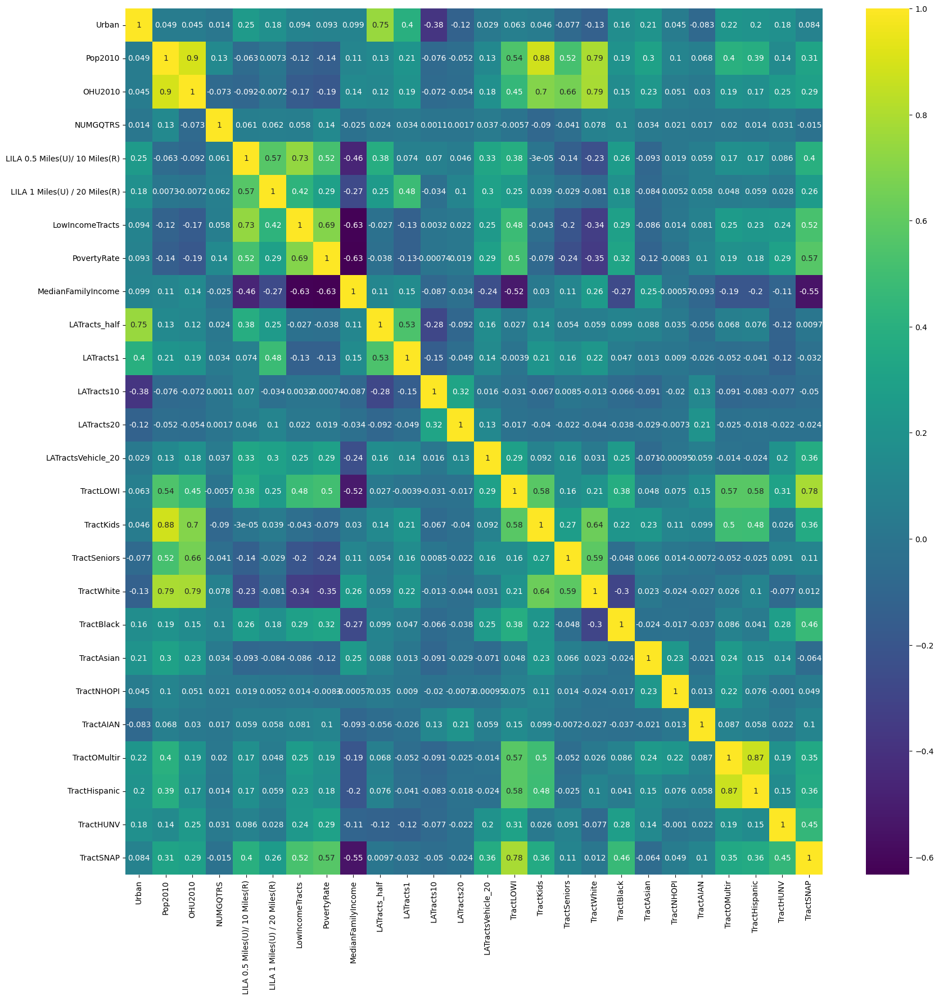

In [17]:
data_2 = data_1.drop(columns=['State','County'])

# Check correlation of all the features with each other
fig = plt.figure(figsize = (20,20))
sns.heatmap(data_2.corr(),annot=True,cmap='viridis')
plt.show()

Observations based on above heatmap:
1) Areas with high population tends to have higher population of kids
2) Areas with higher white people have high number of occupied houses also have high populations.
3) Higher number of tracts with low income, higher is availability of SNAP benefits
4) Higher is population, more are the houses occupied

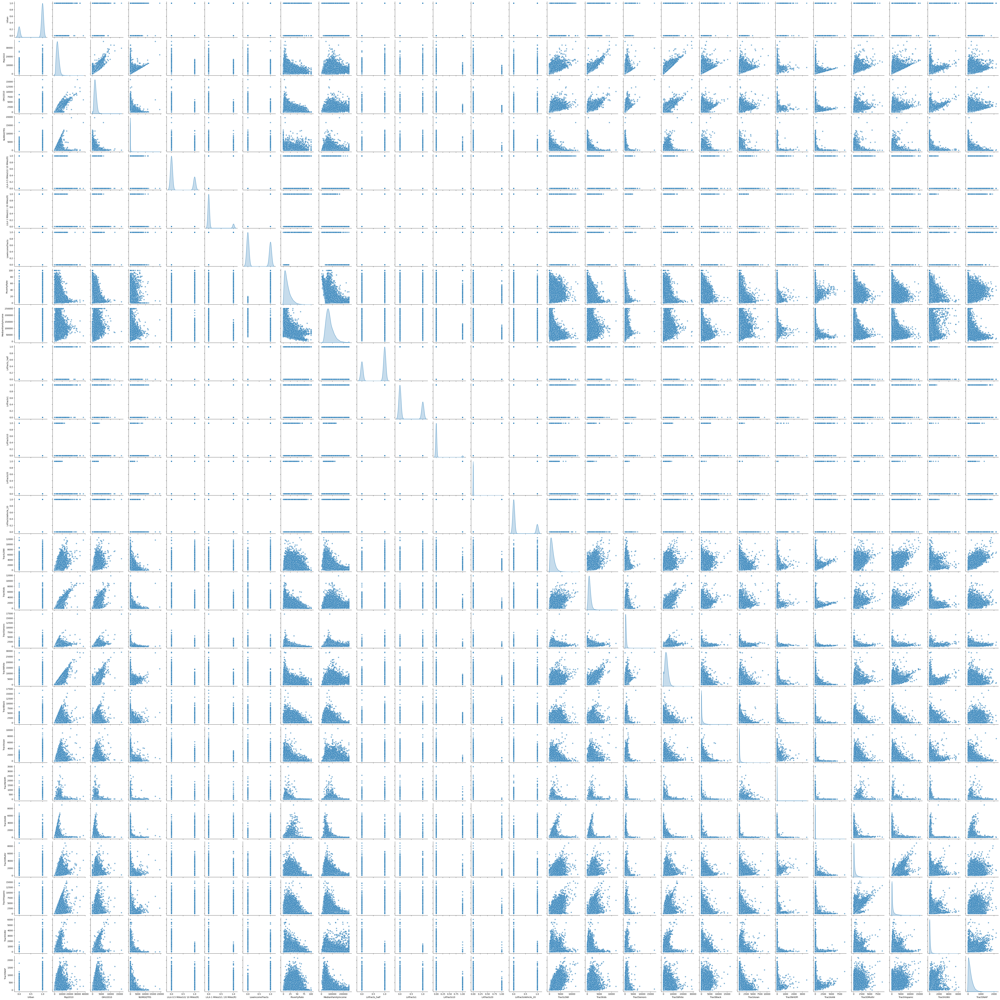

In [18]:
# Using pairplot to create scatter plots with distribution plots along the diagonal
sns.pairplot(data_1, diag_kind="kde", markers="o", plot_kws={'alpha': 0.6})
plt.show()

In [19]:
categorical = ['Urban','LILA 0.5 Miles(U)/ 10 Miles(R)','LILA 1 Miles(U) / 20 Miles(R)','LowIncomeTracts','LATracts_half','LATracts1','LATracts10','LATracts20','LATractsVehicle_20']
numerical = [col for col in data_1.columns if col not in categorical][2:]

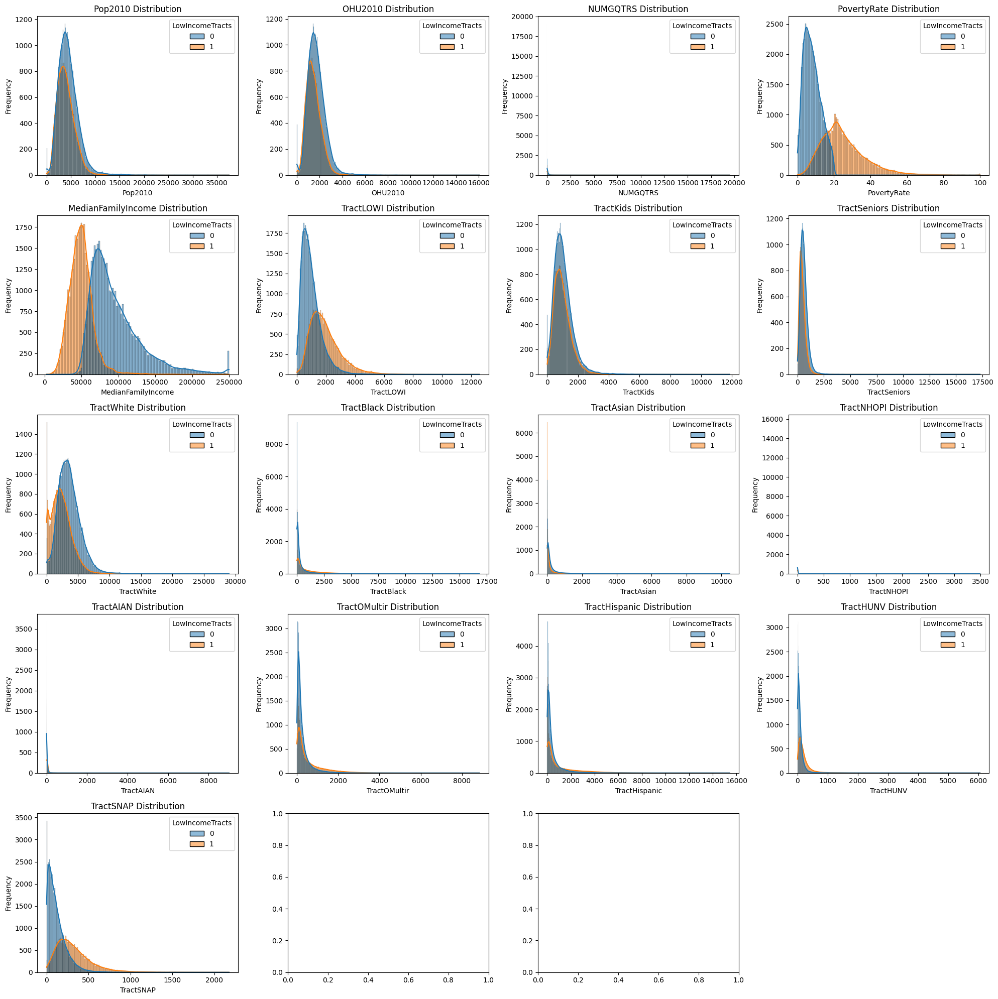

In [20]:
# checking distribution of numerical variables based on low income tracts

fig, axes = plt.subplots(5, 4, figsize=(20, 20))  # 5 rows and 4 columns = 20 tiles

# Flatten axes array to easily iterate over
axes = axes.flatten()

# Loop through each numerical column and plot it in the corresponding tile
for i, col in enumerate(numerical):
    sns.histplot(data_1, x=col, hue='LowIncomeTracts', ax=axes[i], kde=True)
    axes[i].set_title(f'{col} Distribution')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Empty the last tile (index 19)
axes[-1].axis('off')

# Adjust the layout
plt.tight_layout()
plt.show()

Observations based on above graph:
1) avg poverty rate is higher among low income tracts
2) avg median income is lower in low income tracts (expected)

## Regression Analysis

In [21]:
# columns not useful for regression analysis
data_1.drop(columns=['State','County'],inplace=True)

In [22]:
X = data_1.drop('TractSNAP', axis=1)
y = data_1['TractSNAP']

In [23]:
# Splitting dataset to training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [24]:
# gonna apply 2 types of scaling technique to reduce high difference of values among different features and to also reduce skewness of data
numerical_sqrt = ['Pop2010', 'OHU2010', 'PovertyRate', 'MedianFamilyIncome', 'TractLOWI', 'TractKids', 'TractSeniors', 'TractWhite']
numerical_log = [col for col in numerical if col not in numerical_sqrt][:-1] # removing TractSNAP
all_columns = X_train.columns

In [25]:
# Define log and sqrt transformers
log_transformer = FunctionTransformer(lambda x: np.log1p(x))
sqrt_transformer = FunctionTransformer(lambda x: np.sqrt(x))

In [26]:
preprocessor = ColumnTransformer(
    transformers=[
        ('log', log_transformer, numerical_log),
        ('sqrt', sqrt_transformer, numerical_sqrt)
    ],
    remainder='passthrough'  # Keeps other columns (like categorical data) untouched
)

In [27]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])

In [28]:
scaled_X_train = pipeline.fit_transform(X_train)
scaled_X_test = pipeline.transform(X_test)

In [29]:
scaled_X_train = pd.DataFrame(scaled_X_train, columns=numerical_log + numerical_sqrt + categorical)
scaled_X_test = pd.DataFrame(scaled_X_test, columns=numerical_log + numerical_sqrt + categorical)

### Linear Regression

In [30]:
from sklearn.linear_model import LinearRegression

LR_model = LinearRegression()
LR_model.fit(scaled_X_train,y_train)

LinearRegression()

In [31]:
print("Model R2 score:",LR_model.score(scaled_X_test,y_test))

Model R2 score: 0.6843586263944159


In [32]:
from sklearn.metrics import root_mean_squared_error

y_pred = LR_model.predict(scaled_X_test)

result = root_mean_squared_error(y_test,y_pred)
print("RMSE:",result)

RMSE: 105.94103300130946


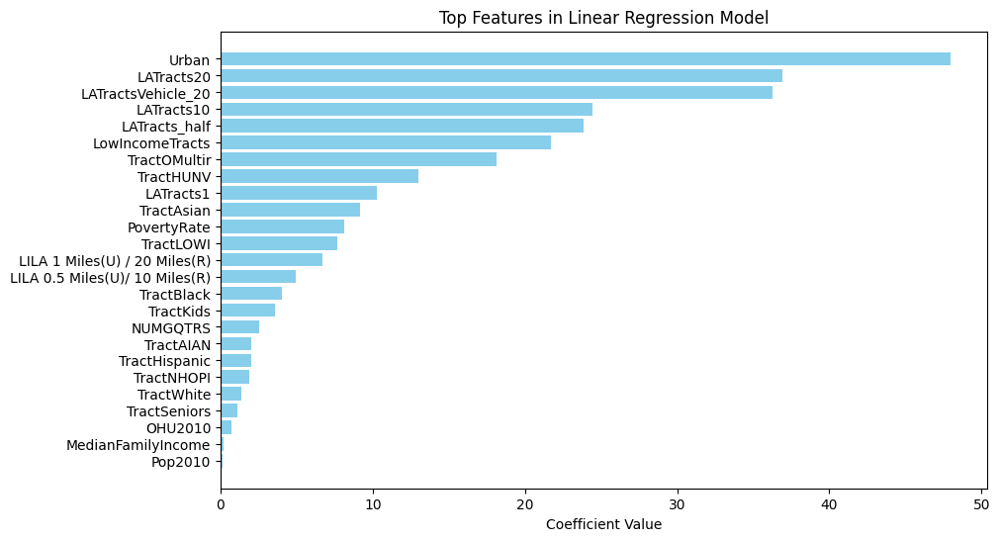

In [33]:
# Get the feature coefficients and their corresponding feature names
coefficients = LR_model.coef_
feature_importance = pd.DataFrame({
    'Feature': scaled_X_test.columns,
    'Coefficient': coefficients
})

# Sort by absolute value of coefficients to get the most important features
feature_importance['Abs_Coefficient'] = np.abs(feature_importance['Coefficient'])
feature_importance = feature_importance.sort_values(by='Abs_Coefficient', ascending=False)

# Plotting the bar chart for feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'], feature_importance['Abs_Coefficient'], color='skyblue')
plt.xlabel('Coefficient Value')
plt.title('Top Features in Linear Regression Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the top features at the top
plt.show()

### Polynomial regression

In [34]:
from sklearn.preprocessing import PolynomialFeatures

for i in range(1,4):
    # Fit a polynomial regression model 
    poly_features = PolynomialFeatures(degree=i)
    X_train_poly = poly_features.fit_transform(scaled_X_train)
    model_poly = LinearRegression().fit(X_train_poly,y_train)

    X_test_poly = poly_features.transform(scaled_X_test)

    y_pred = model_poly.predict(X_test_poly)

    result = root_mean_squared_error(y_test,y_pred)

    print("Model score on degree "+str(i),model_poly.score(X_test_poly,y_test))
    print("RMSE on degree "+str(i),result)

Model score on degree 1 0.6843586263944157
RMSE on degree 1 105.94103300130948
Model score on degree 2 0.8172540073570412
RMSE on degree 2 80.61041780388108
Model score on degree 3 0.827701279094426
RMSE on degree 3 78.27233101465058


In [35]:
poly_features = PolynomialFeatures(degree=3)
X_train_poly = poly_features.fit_transform(scaled_X_train)
model_poly = LinearRegression().fit(X_train_poly,y_train)

X_test_poly = poly_features.transform(scaled_X_test)
y_pred = model_poly.predict(X_test_poly)

result = root_mean_squared_error(y_test,y_pred)

print("RMSE on degree "+str(i),result)
print("Model R2 score:",model_poly.score(X_test_poly,y_test))

RMSE on degree 3 78.27233101465058
Model R2 score: 0.827701279094426


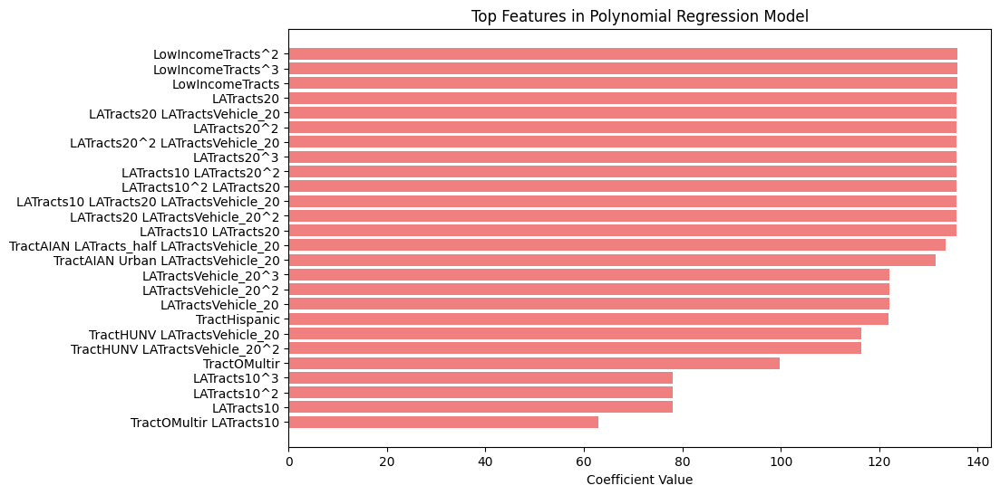

In [36]:
coefficients = model_poly.coef_[1:]  # Ignore the bias term
feature_names = poly_features.get_feature_names_out(scaled_X_train.columns)[1:]  # Ignore the bias term

# Create a DataFrame for feature importance
feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

# Sort by the absolute value of coefficients to get the most important features
feature_importance['Abs_Coefficient'] = feature_importance['Coefficient'].abs()
feature_importance = feature_importance.sort_values(by='Abs_Coefficient', ascending=False)

# Plotting the bar chart for feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'][:26], feature_importance['Abs_Coefficient'][:26], color='lightcoral')
plt.xlabel('Coefficient Value')
plt.title('Top Features in Polynomial Regression Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the top features at the top
plt.show()

### Ridge, Lasso and ElasticNet Regression

In [37]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet

# Ridge Regression
ridge = Ridge()
ridge.fit(scaled_X_train, y_train)
ridge_pred = ridge.predict(scaled_X_test)
print(f"Ridge RMSE: {root_mean_squared_error(y_test, ridge_pred):.4f}")
print("Model R2 score:",ridge.score(scaled_X_test,y_test))

# Lasso Regression
lasso = Lasso()
lasso.fit(scaled_X_train, y_train)
lasso_pred = lasso.predict(scaled_X_test)
print(f"Lasso RMSE: {root_mean_squared_error(y_test, lasso_pred):.4f}")
print("Model R2 score:",lasso.score(scaled_X_test,y_test))

# Elastic Net Regression
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5)  # l1_ratio balances L1 and L2
elastic_net.fit(scaled_X_train, y_train)
elastic_pred = elastic_net.predict(scaled_X_test)
print(f"Elastic Net RMSE: {root_mean_squared_error(y_test, elastic_pred):.4f}")
print("Model R2 score:",elastic_net.score(scaled_X_test,y_test))

Ridge RMSE: 105.9410
Model R2 score: 0.6843589528001897
Lasso RMSE: 106.6061
Model R2 score: 0.6803830369789128
Elastic Net RMSE: 106.3606
Model R2 score: 0.6818537709835353


### Decision Tree Regressor

In [38]:
from sklearn.tree import DecisionTreeRegressor

for i in range(1,15):
    reg = DecisionTreeRegressor(max_depth = i, random_state=42)
    reg.fit(scaled_X_train, y_train)

    # Predictions and Mean Squared Error
    y_pred = reg.predict(scaled_X_test)
    print("RMSE:", root_mean_squared_error(y_test, y_pred))

RMSE: 145.72764944055723
RMSE: 126.0558303681349
RMSE: 113.95027640525235
RMSE: 107.16363312174622
RMSE: 102.31672454196523
RMSE: 98.58592850122729
RMSE: 97.06615311445873
RMSE: 94.36208879889438
RMSE: 94.03241600505667
RMSE: 93.30100656383044
RMSE: 95.30071003601977
RMSE: 97.30249479319616
RMSE: 100.32950465454083
RMSE: 101.13193314421022


### Random forest regressor

In [39]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

rf = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=15)
rf.fit(X_train, y_train)

# Predictions
y_pred = rf.predict(X_test)

# Evaluation Metrics
print("Root mean Squared Error:", root_mean_squared_error(y_test, y_pred))
print("R2 Score:", r2_score(y_test, y_pred))

Root mean Squared Error: 80.38845936260788
R2 Score: 0.8182589934026214


### Logistic Regression

In [40]:
X = data_1.drop('Urban', axis=1)
y = data_1['Urban']

In [41]:
# Splitting dataset to training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [42]:
# gonna apply 2 types of scaling technique to reduce high difference of values among different features and to also reduce skewness of data
numerical_sqrt = ['Pop2010', 'OHU2010', 'PovertyRate', 'MedianFamilyIncome', 'TractLOWI', 'TractKids', 'TractSeniors', 'TractWhite']
numerical_log = [col for col in numerical if col not in numerical_sqrt]
all_columns = X_train.columns

In [43]:
categorical = ['LILA 0.5 Miles(U)/ 10 Miles(R)','LILA 1 Miles(U) / 20 Miles(R)','LowIncomeTracts','LATracts_half','LATracts1','LATracts10','LATracts20','LATractsVehicle_20']

In [44]:
# Define log and sqrt transformers
log_transformer = FunctionTransformer(lambda x: np.log1p(x))
sqrt_transformer = FunctionTransformer(lambda x: np.sqrt(x))

In [45]:
preprocessor = ColumnTransformer(
    transformers=[
        ('log', log_transformer, numerical_log),
        ('sqrt', sqrt_transformer, numerical_sqrt)
    ],
    remainder='passthrough'  # Keeps other columns (like categorical data) untouched
)

In [46]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])

In [47]:
scaled_X_train = pipeline.fit_transform(X_train)
scaled_X_test = pipeline.transform(X_test)

In [48]:
scaled_X_train = pd.DataFrame(scaled_X_train, columns=numerical_log + numerical_sqrt + categorical)
scaled_X_test = pd.DataFrame(scaled_X_test, columns=numerical_log + numerical_sqrt + categorical)

In [49]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

log_model = LogisticRegression(max_iter = 58014,random_state=42)
log_model.fit(scaled_X_train, y_train)

# Make predictions
y_pred = log_model.predict(scaled_X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.9817981246552675

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.97      0.96      3471
           1       0.99      0.99      0.99     11033

    accuracy                           0.98     14504
   macro avg       0.97      0.98      0.98     14504
weighted avg       0.98      0.98      0.98     14504



## Evaluation Metrics for All Models

### Linear Regression
- \( R^2 \): 68.4%
- RMSE: 105.94
- **Key Features**: Accessibility flags such as `LATracts_half` and `LATractsVehicle_20` were prominent predictors.

### Polynomial Regression
- Degree 1 (Linear Equivalent):
  - \( R^2 \): 68.4%
  - RMSE: 105.94
- Degree 2:
  - \( R^2 \): 81.7%
  - RMSE: 80.61
- Degree 3:
  - \( R^2 \): 82.7%
  - RMSE: 78.27
- **Key Features**: Higher-order interactions among features significantly improved model fit.

### Ridge Regression
- \( R^2 \): 68.4%
- RMSE: 105.94
- **Observation**: Similar performance to linear regression, with added regularization.

### Lasso Regression
- \( R^2 \): 68.0%
- RMSE: 106.61
- **Observation**: Introduced sparsity in feature selection but slightly higher RMSE.

### ElasticNet Regression
- \( R^2 \): 68.2%
- RMSE: 106.36
- **Observation**: Balanced L1 and L2 penalties for feature regularization.

### Decision Tree Regressor
- Best \( R^2 \): Achieved at max depth 9.
- RMSE: 94.03 (best depth).
- **Observation**: Performed well but risked overfitting at deeper levels.

### Random Forest Regressor
- \( R^2 \): 81.8%
- RMSE: 80.39
- **Observation**: Robust performance with ensemble learning.

### Logistic Regression (for classification)
- Accuracy: 98.1%
- Precision: 97%
- Recall: 96%
- F1-Score: 96%
- **Observation**: Exceptional classification performance for binary tasks like urban flag prediction.

---

## Comparison of Model Performance

| Model                  | Task                  | \( R^2 \)/Accuracy | RMSE/F1-Score  | Key Strengths                                | Limitations                               |
|------------------------|-----------------------|--------------------|----------------|----------------------------------------------|-------------------------------------------|
| **Linear Regression**  | Regression            | 68.4%             | 105.94         | Interpretable and straightforward baseline   | Struggles with non-linear relationships   |
| **Polynomial Regression** (Degree 3) | Regression | 82.7%         | 78.27          | Captures non-linear interactions            | Computationally expensive, risk of overfitting |
| **Ridge Regression**   | Regression            | 68.4%             | 105.94         | Adds regularization to avoid overfitting     | No performance improvement over baseline  |
| **Lasso Regression**   | Regression            | 68.0%             | 106.61         | Sparse feature selection for interpretability| Slightly higher RMSE than linear regression |
| **ElasticNet**         | Regression            | 68.2%             | 106.36         | Balances L1 and L2 regularization penalties  | Performance similar to Lasso              |
| **Decision Tree**      | Regression            | ~80% (best)       | ~94.03         | Non-linear modeling with interpretability    | Overfitting risk at deeper depths         |
| **Random Forest**      | Regression            | 81.8%             | 80.39          | Strong generalization with ensemble learning| Computationally intensive                 |
| **Logistic Regression**| Classification        | 98.1% Accuracy    | 96% F1-Score   | Exceptional classification performance       | Not applicable to regression tasks        |

---

## Insights from Comparison

### Best Regression Model
- **Polynomial Regression (Degree 3)**: Achieved the best performance for regression with \( R^2 = 82.7\% \) and RMSE of 78.27. Captured complex relationships but required careful tuning to avoid overfitting.

### Classification Model
- **Logistic Regression**: Delivered near-perfect accuracy (98.1%) for binary classification tasks, showing its strength in handling categorical target variables.

### Ensemble Advantage
- **Random Forest** demonstrated strong performance, combining interpretability and generalization for regression tasks, though slightly outperformed by polynomial regression.

### Regularization Techniques
- **Ridge, Lasso, and ElasticNet** introduced regularization but did not outperform simple linear regression.


## Summary of Findings

### Key Observations
- **SNAP Benefits Distribution**:
  - Higher SNAP distributions were observed in areas with larger populations, likely influenced by low-income tracts.
- **Demographic Insights**:
  - Certain racial demographics, such as White and Asian populations, were more represented in higher-income areas, while other groups were more concentrated in low-income areas.
- **Income Disparity**:
  - Urban areas showed significantly higher median family incomes compared to rural areas.

### Statistical Hypotheses
- **Income Differences**:
  - Statistical testing (t-tests) revealed significant differences in median family incomes between urban and rural areas, with a very low p-value indicating strong evidence against the null hypothesis.
- **Poverty Rates Across Tracts**:
  - Kruskal-Wallis tests confirmed notable differences in poverty rates between high-income and low-income tracts, again with strong statistical evidence.

### Regression Analysis
- **Linear Regression**:
  - Achieved an \( R^2 \) score of ~68% with a root mean square error (RMSE) of ~106. Key features like accessibility metrics emerged as significant predictors.
- **Polynomial Regression**:
  - Improved performance with \( R^2 = 82.7\% \) and RMSE = 78.2 for degree-3 models. Similar features emerged as top contributors.
- **Logistic Regression**:
  - Performed exceptionally well for classification tasks, achieving 98% accuracy in some scenarios.

### Additional Insights
- Strong correlations were observed between demographic and income-related variables.
- Feature scaling methods like log and square root transformations helped address skewness and variance differences effectively.

---

## Insights and Implications

### Policy Implications
- Concentrated disparities in certain areas underscore the need for targeted policies to address resource distribution and socio-economic inequalities.
- Addressing demographic disparities in low-income areas could help reduce poverty rates.

### Predictive Insights
- Accessibility features consistently emerged as significant predictors, indicating that enhancing resource access could be a key lever for intervention.
- Predictive models could help streamline resource allocation and improve program efficiency.

### Urban vs. Rural Dynamics
- The pronounced income gap between urban and rural areas highlights the necessity for economic programs tailored to the unique challenges of rural communities.

### Model Performance
- Polynomial regression demonstrated better performance than linear regression, effectively capturing non-linear relationships in the data.
- Logistic regression proved to be highly effective for classification, offering actionable insights with strong predictive power.
